In [1]:
from Library_Kaggle_Atlas_Proteins import *

In [2]:
label_names

{0: 'Nucleoplasm',
 1: 'Nuclear membrane',
 2: 'Nucleoli',
 3: 'Nucleoli fibrillar center',
 4: 'Nuclear speckles',
 5: 'Nuclear bodies',
 6: 'Endoplasmic reticulum',
 7: 'Golgi apparatus',
 8: 'Peroxisomes',
 9: 'Endosomes',
 10: 'Lysosomes',
 11: 'Intermediate filaments',
 12: 'Actin filaments',
 13: 'Focal adhesion sites',
 14: 'Microtubules',
 15: 'Microtubule ends',
 16: 'Cytokinetic bridge',
 17: 'Mitotic spindle',
 18: 'Microtubule organizing center',
 19: 'Centrosome',
 20: 'Lipid droplets',
 21: 'Plasma membrane',
 22: 'Cell junctions',
 23: 'Mitochondria',
 24: 'Aggresome',
 25: 'Cytosol',
 26: 'Cytoplasmic bodies',
 27: 'Rods & rings'}

# Find the shape according to preprocessing choices

In [3]:
def shape(grad, dir_grad, grad_threshold, nb_rot, nb_threshold, block_size):
    if block_size != 0: 
        h = 512//block_size
        h_rest = (512%block_size)>0
    else:
        h, h_rest= 512, 0
        
    return (h+h_rest, h+h_rest, 4 + 4*grad + dir_grad*4*len(np.arange(0, 360, 360//nb_rot)) + grad_threshold*4*len(np.arange(0,128,128//nb_threshold)))

In [4]:
train_path = "/Users/mohamed/Desktop/Kaggle-Protein/train"

In [5]:
train_labels = pd.read_csv("/Users/mohamed/Desktop/Kaggle-Protein/train.csv")

In [6]:
labels_path = "/Users/mohamed/Desktop/Kaggle-Protein/train.csv"

# Distribution of Labels: sorted by increasing frequency

In [7]:
a=train_labels['Target']

In [8]:
a = a.unique()

In [9]:
a.shape[0]

582

In [10]:
L=[]
for l in a:
    L.append([l,np.sum(train_labels['Target']==l)])

In [11]:
data = pd.DataFrame(L, columns=["Labels", "count"])

In [12]:
d_sort = data.sort_values(by = ["count"])

<BarContainer object of 100 artists>

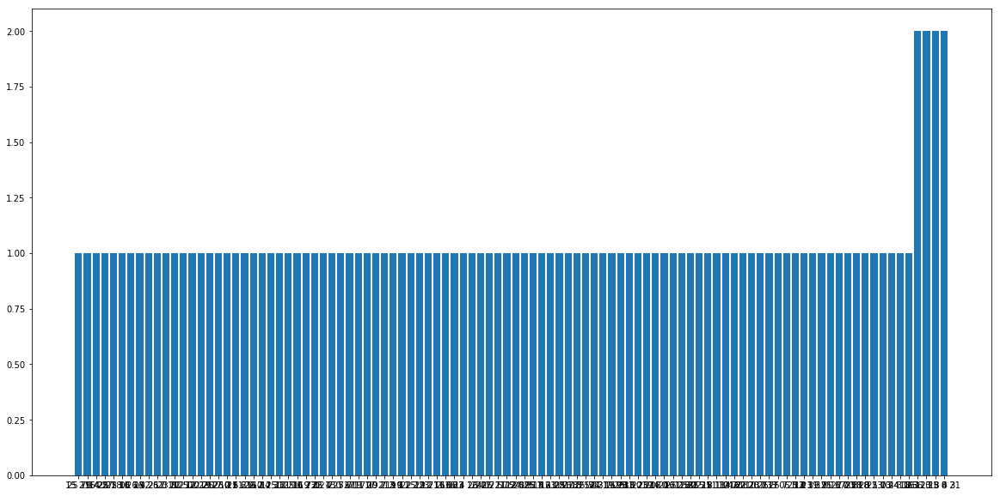

In [13]:
plt.figure(figsize=(20,10))
plt.bar(d_sort["Labels"][:100], d_sort["count"][:100])

In [14]:
train_labels = pd.read_csv("/Users/mohamed/Desktop/train.csv")
train_labels = train_labels.apply(fill_targets, axis=1)
your_choice = list(label_names.values())
your_batch_size = 15

# Load data with choice of labels and preprocessing

In [15]:
imageloader = TargetGroupIterator(your_choice, your_batch_size,
                                  labels_path, train_path, ws = 3, 
                                  grad = True, dir_grad = True, grad_threshold = True,
                                 nb_rot= 4, nb_threshold=12, reduce=False, block_size=0)

In [16]:
imageloader.find_matching_data_entries()
iterator = imageloader.get_loader()
file_ids, labels, images = next(iterator)

# Data shape 

In [17]:
images.shape

(15, 512, 512, 76)

In [18]:
labels.shape

(15, 28)

In [19]:
def return_name(img):
    name=[]
    l=list(label_names.values())
    j=0
    for i in labels[img]:
        if i==1:
            name.append(l[j])
        j+=1
    return name

In [20]:
def make_image_row(image, subax, title, i ):
    subax[0].imshow(image[:,:,4*i], cmap="Greens")
    subax[1].imshow(image[:,:,4*i+1], cmap="Reds")
    subax[1].set_title("stained microtubules")
    subax[2].imshow(image[:,:,4*i+2], cmap="Blues")
    subax[2].set_title("stained nucleus")
    subax[3].imshow(image[:,:,4*i+3], cmap="Oranges")
    subax[3].set_title("stained endoplasmatic reticulum")
    subax[0].set_title(title)
    return subax

# Labels with for pool of size 5

In [21]:
for i in range (5):
    print(return_name(i))

['Nucleoplasm', 'Cytokinetic bridge']
['Nucleoplasm', 'Nuclear membrane', 'Nucleoli', 'Golgi apparatus']
['Nuclear bodies']
['Nuclear membrane']
['Microtubule organizing center']


In [22]:
for i in range (5,10,1):
    print(return_name(i))

['Nucleoplasm']
['Nucleoli', 'Cytosol']
['Nucleoplasm']
['Nucleoplasm', 'Nucleoli']
['Golgi apparatus']


In [23]:
for i in range (10,15,1):
    print(return_name(i))

['Mitochondria']
['Plasma membrane']
['Nucleoplasm', 'Aggresome']
['Mitochondria']
['Nucleoli', 'Endoplasmic reticulum']


# Play with filters

In [24]:
block_size = 8
block=(1,block_size,block_size,1)
block_features=block_reduce(images,block,np.mean)

In [25]:
from imgaug import augmenters as iaa
def augment(image):
    augment_img = iaa.Sequential([
        iaa.OneOf([
            iaa.Affine(rotate=0),
            iaa.Affine(rotate=90),
            iaa.Affine(rotate=180),
            iaa.Affine(rotate=270),
            iaa.Fliplr(0.5),
            iaa.Flipud(0.5),
        ])], random_order=False)

    image_aug = augment_img.augment_image(image)
    return image_aug

In [26]:
i =augment(images[0])

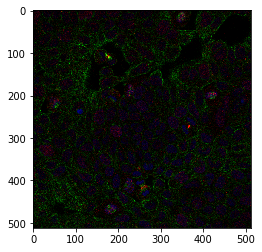

In [27]:
plt.imshow(i[:,:,:3]/255)

In [28]:
images.shape

(15, 512, 512, 76)

In [29]:
block_features.shape

(15, 64, 64, 76)

### Images not modify

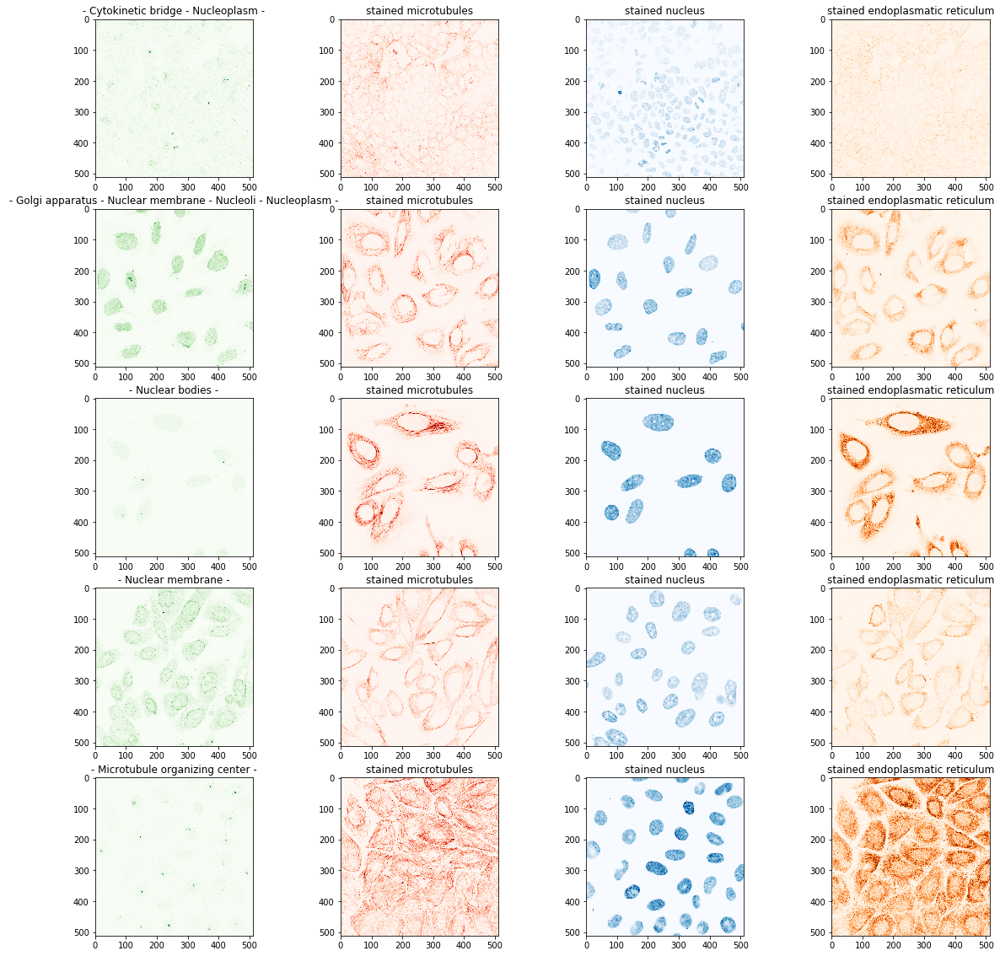

In [30]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=0
for n in range (5):
    make_image_row(images[n], ax[n], make_title(file_ids[n], train_labels), filters)

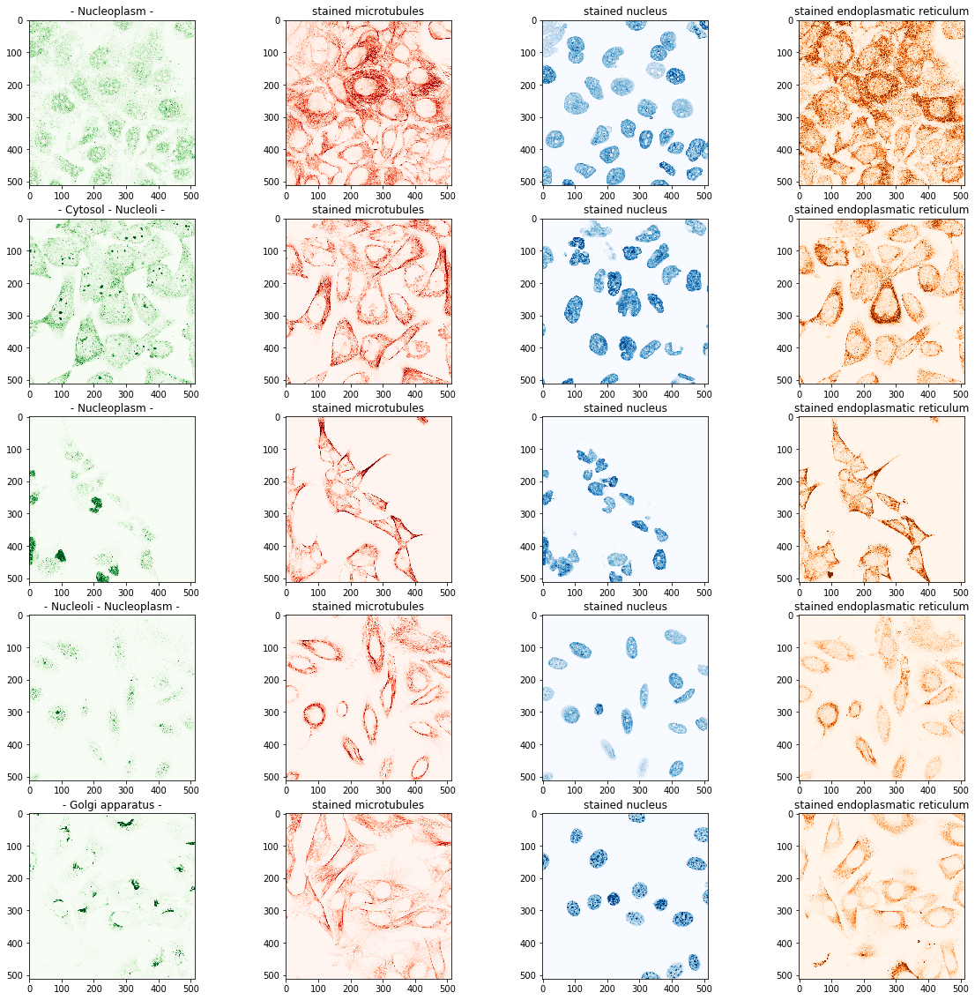

In [31]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=0
for n in range (5,10):
    make_image_row(images[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

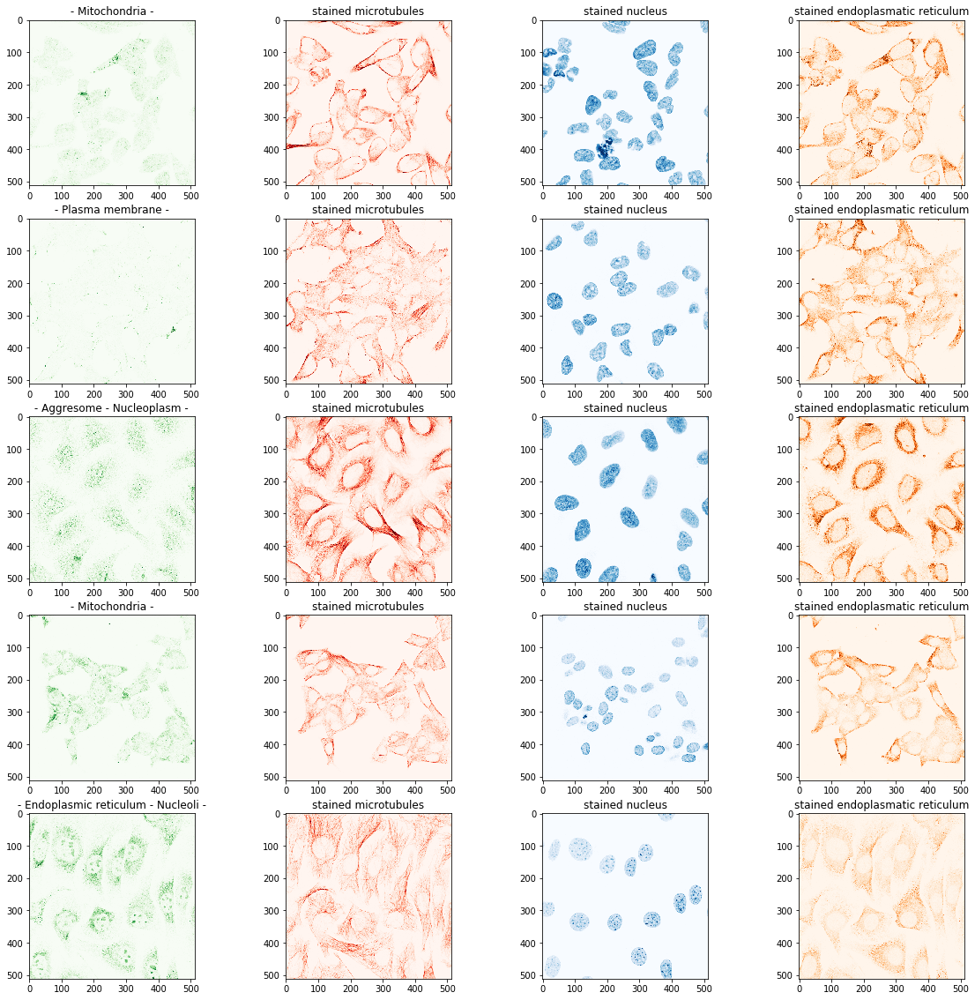

In [32]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=0
for n in range (10,15):
    make_image_row(images[n], ax[n-10], make_title(file_ids[n], train_labels), filters)

# Images with size reduced

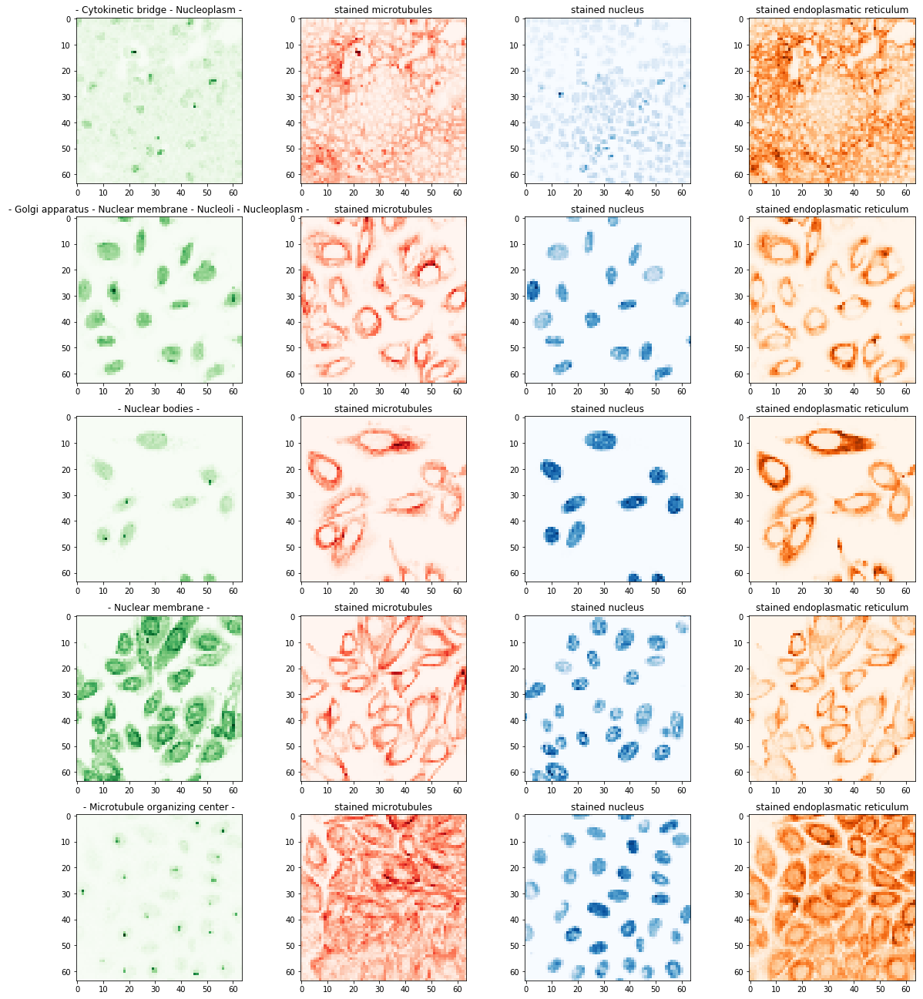

In [33]:
fig, ax = plt.subplots(5,4,figsize=(20,23))
filters=0
for n in range (5):
    make_image_row(block_features[n], ax[n], make_title(file_ids[n], train_labels), filters)

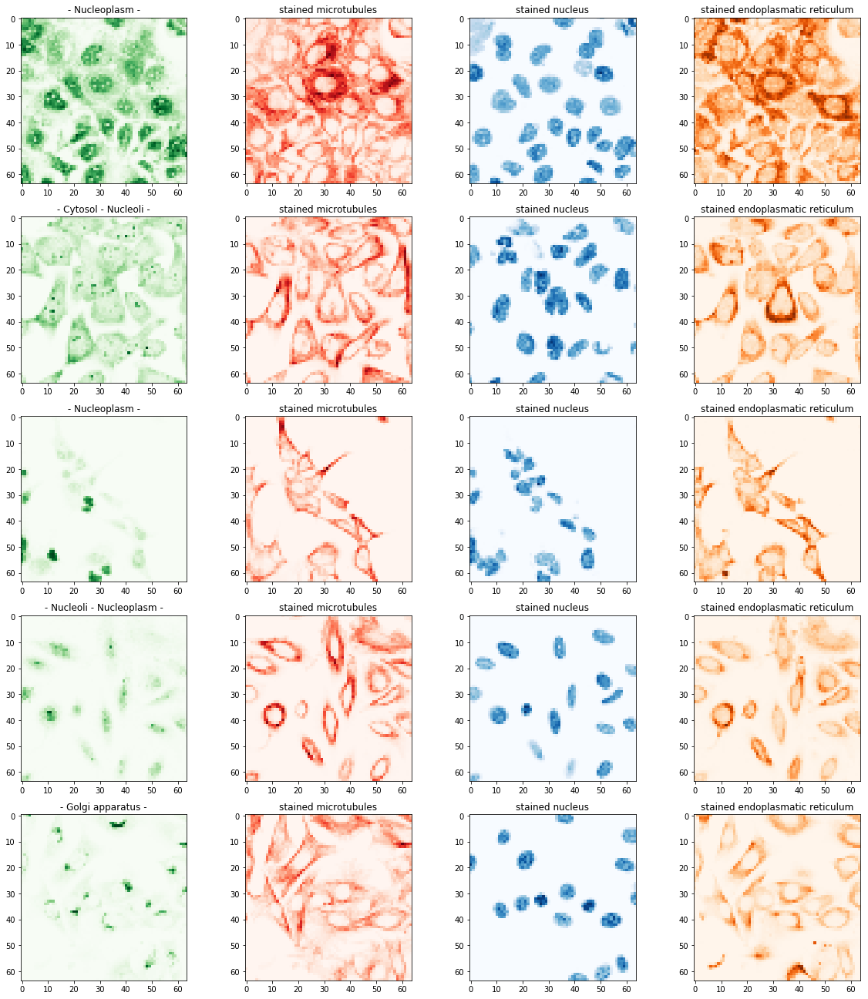

In [34]:
fig, ax = plt.subplots(5,4,figsize=(20,23))
filters=0
for n in range (5,10):
    make_image_row(block_features[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

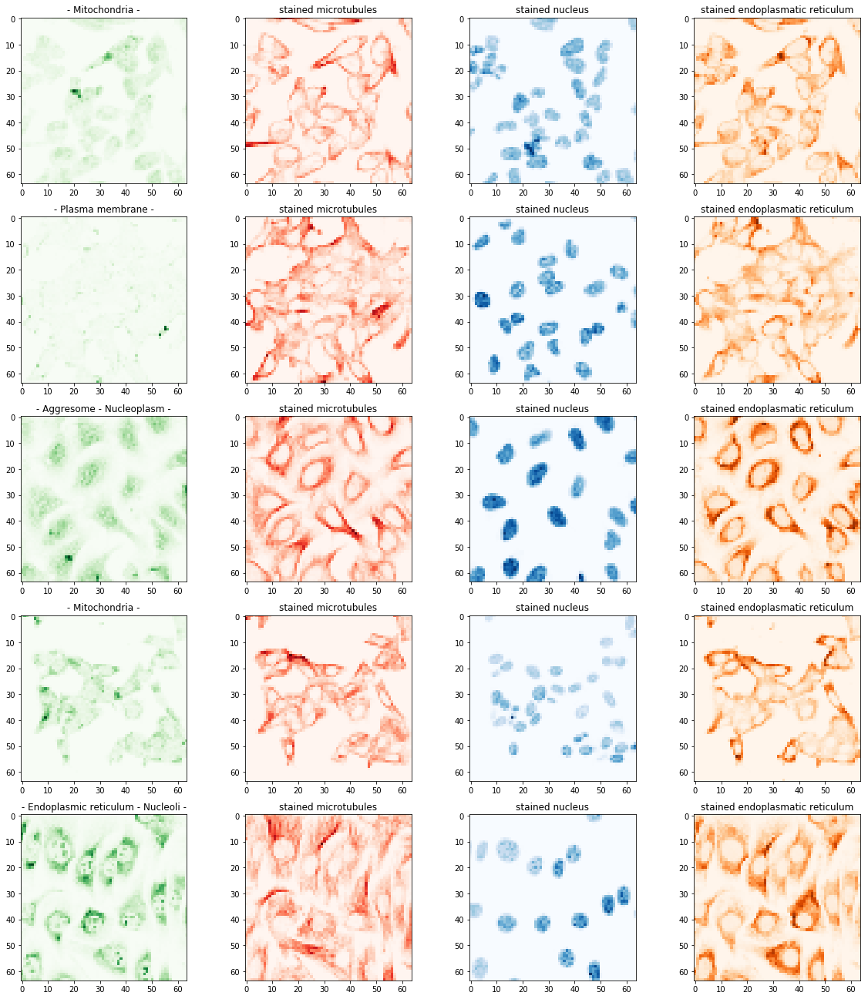

In [35]:
fig, ax = plt.subplots(5,4,figsize=(20,23))
filters=0
for n in range (10,15):
    make_image_row(block_features[n], ax[n-10], make_title(file_ids[n], train_labels), filters)

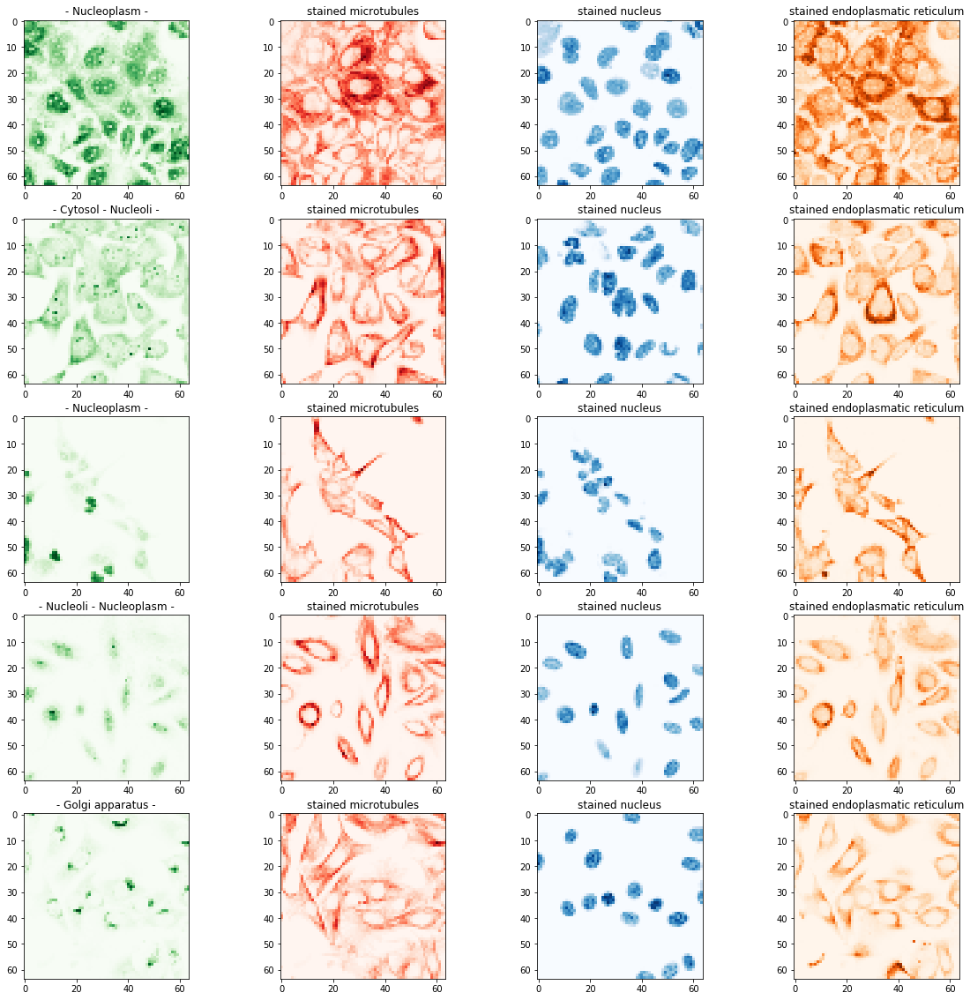

In [36]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=0
for n in range (5,10):
    make_image_row(block_features[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

### Directional gradiant teta =0

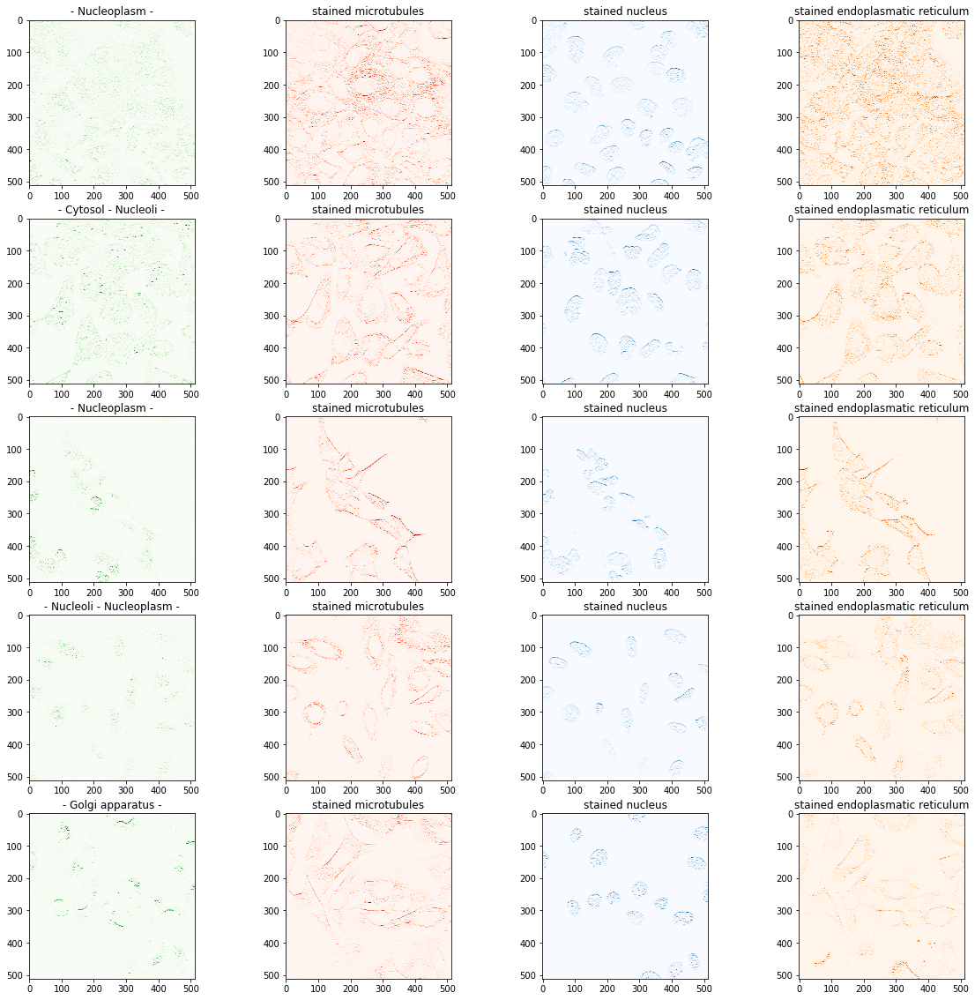

In [37]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=2
for n in range (5,10):
    make_image_row(images[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

### Directional gradiant teta =90

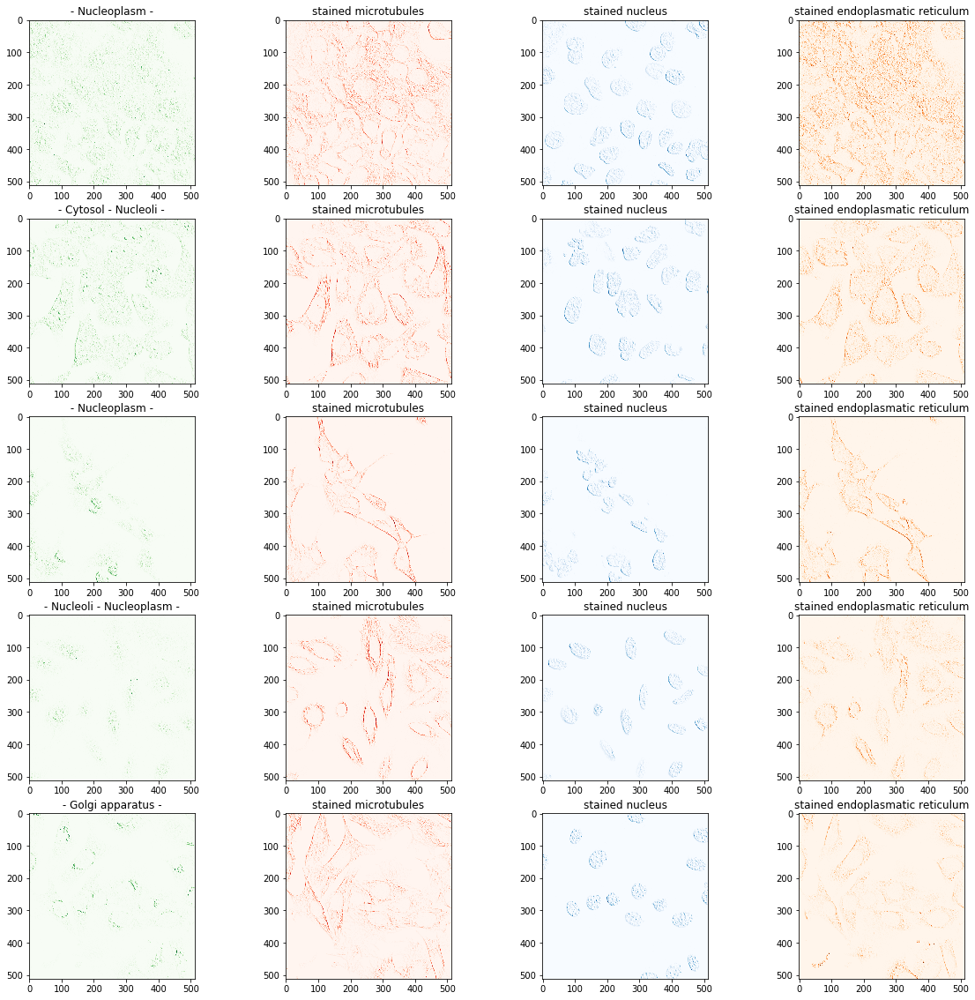

In [38]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=3
for n in range (5,10):
    make_image_row(images[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

### Directional gradiant teta =180

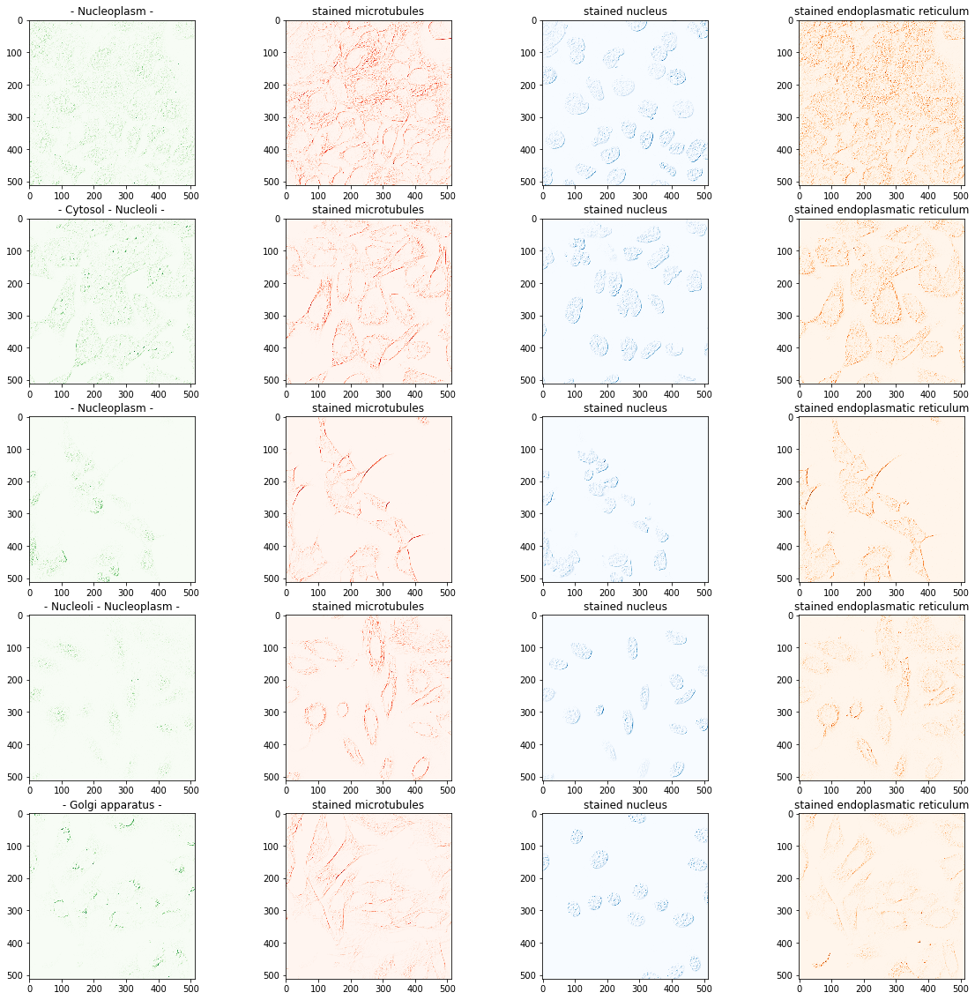

In [39]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=4
for n in range (5,10):
    make_image_row(images[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

### Gradient threshold=0

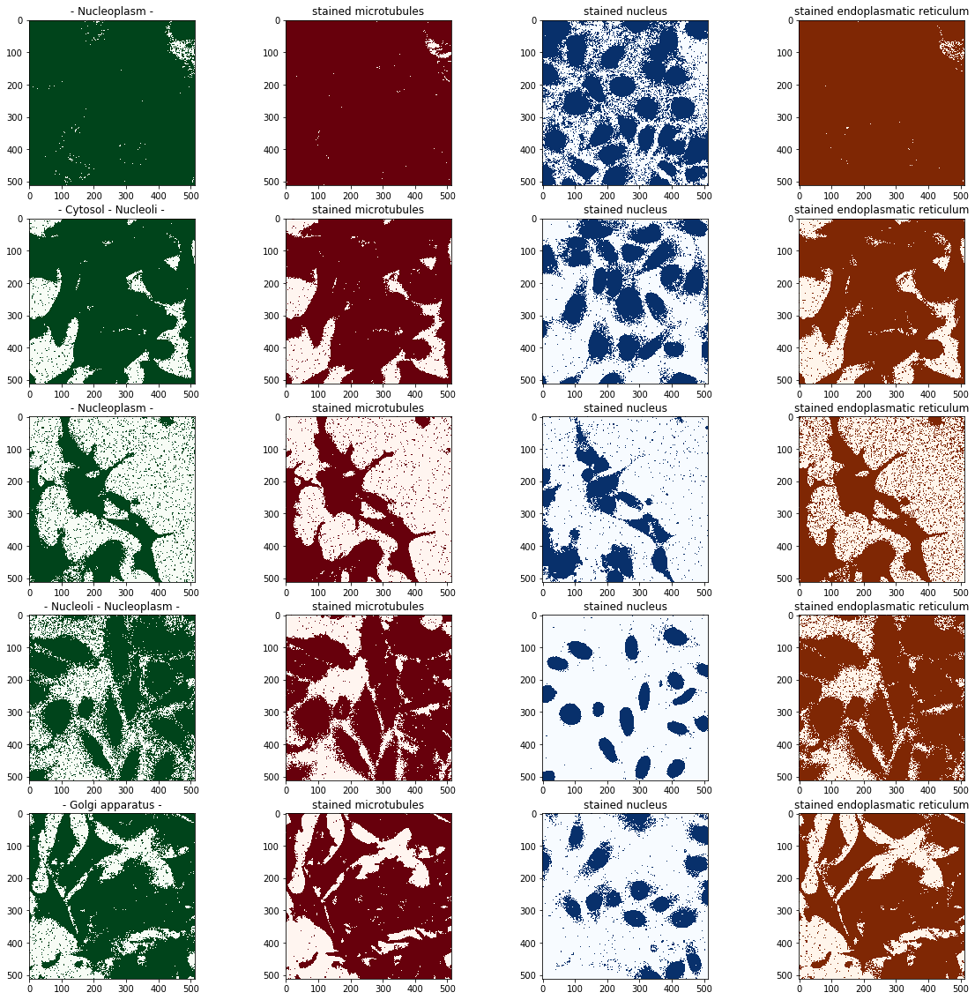

In [40]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=6
for n in range (5,10):
    make_image_row(images[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

### Gradient threshold=90

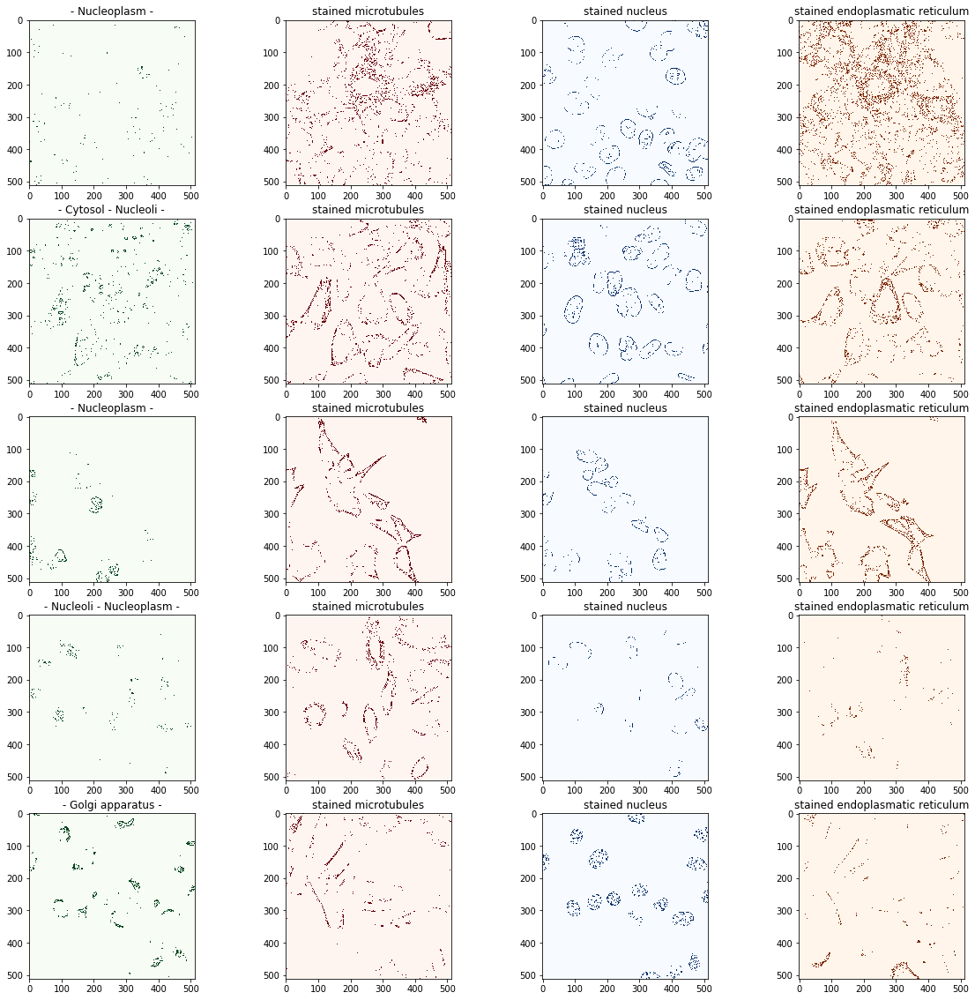

In [41]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=16
for n in range (5,10):
    make_image_row(images[n], ax[n-5], make_title(file_ids[n], train_labels), filters)

# Visualization Analysis

### "Cytosol" example

In [42]:
your_choice = ["Cytosol"]
your_batch_size = 10

In [43]:
imageloader = TargetGroupIterator(your_choice, your_batch_size,
                                  labels_path, train_path, ws = 3, 
                                  grad = True, dir_grad = True, grad_threshold = True,
                                 nb_rot= 4, nb_threshold=12, reduce=False, block_size=0)

In [44]:
imageloader.find_matching_data_entries()
iterator = imageloader.get_loader()
file_ids, labels, images = next(iterator)

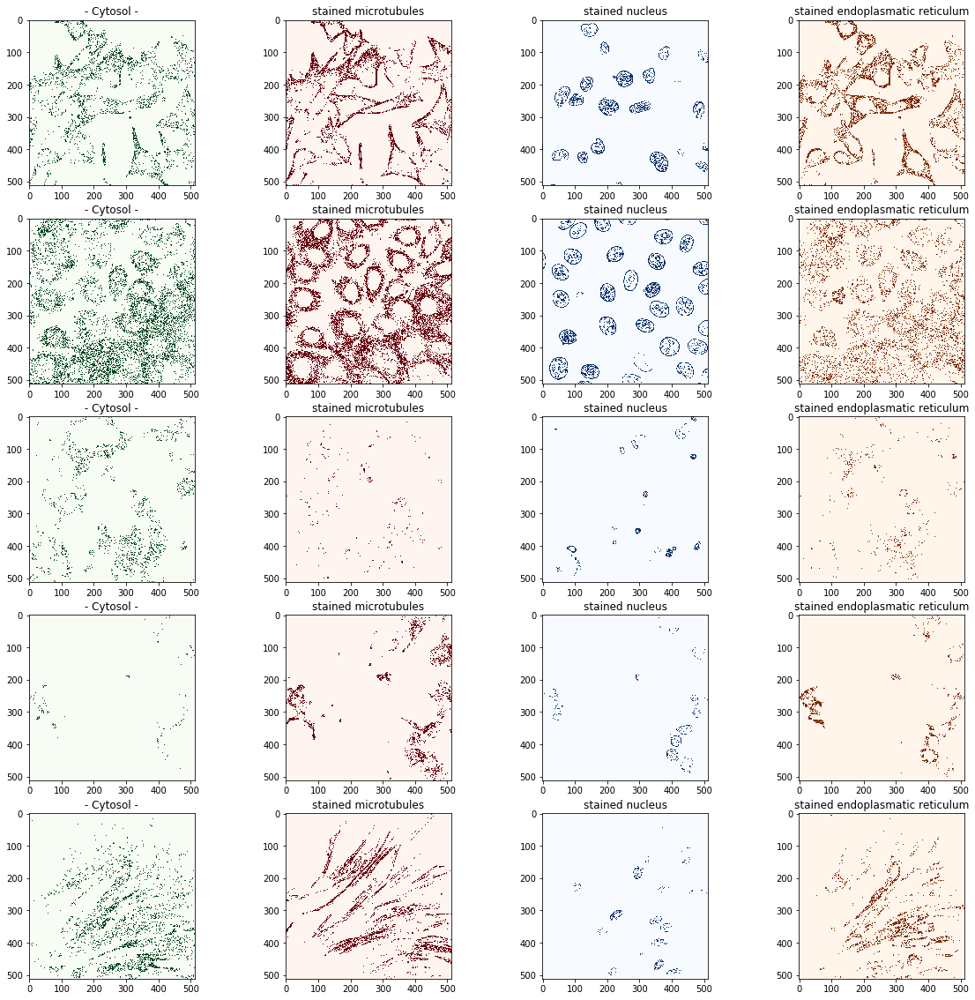

In [45]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=10
for n in range (5):
    make_image_row(images[n], ax[n], make_title(file_ids[n], train_labels), filters)

### "Nucleoplasm" example

In [46]:
your_choice = ["Nucleoplasm"]
your_batch_size = 5

In [47]:
imageloader = TargetGroupIterator(your_choice, your_batch_size,
                                  labels_path, train_path, ws = 3, 
                                  grad = True, dir_grad = True, grad_threshold = True,
                                 nb_rot= 4, nb_threshold=12, reduce=False, block_size=0)

In [48]:
imageloader.find_matching_data_entries()
iterator = imageloader.get_loader()
file_ids, labels, images = next(iterator)

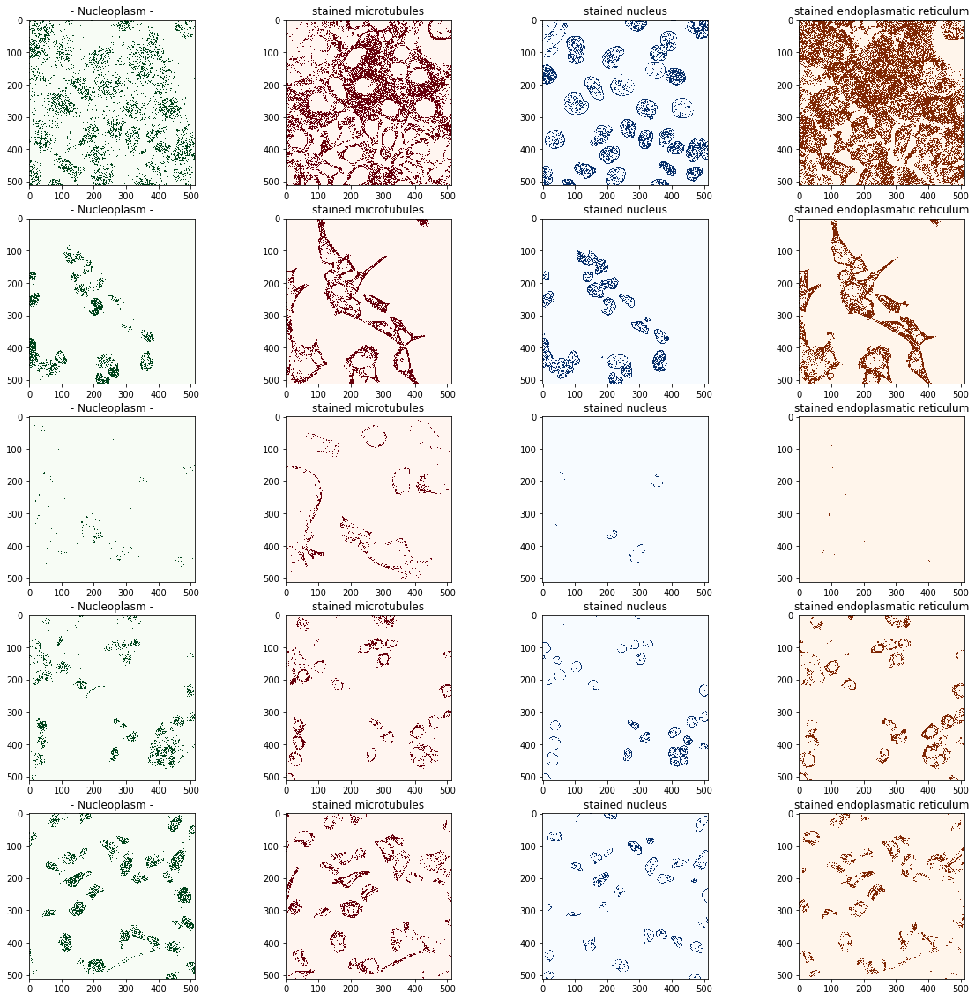

In [49]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=10
for n in range (5):
    make_image_row(images[n], ax[n], make_title(file_ids[n], train_labels), filters)

### "Microtubule organizing center" example

In [50]:
your_choice = ["Microtubule organizing center"]
your_batch_size = 10

In [51]:
imageloader = TargetGroupIterator(your_choice, your_batch_size,
                                  labels_path, train_path, ws = 3, 
                                  grad = True, dir_grad = True, grad_threshold = True,
                                 nb_rot= 4, nb_threshold=12, reduce=False, block_size=0)

In [52]:
imageloader.find_matching_data_entries()
iterator = imageloader.get_loader()
file_ids, labels, images = next(iterator)

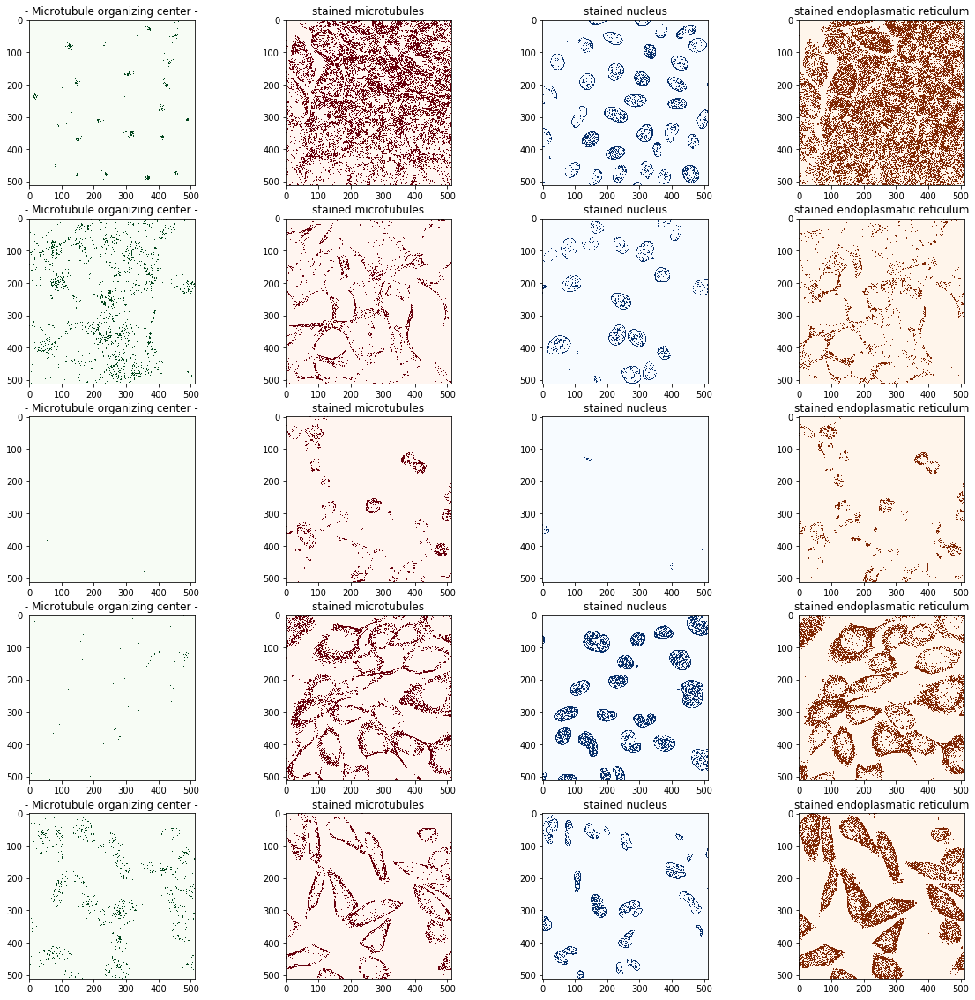

In [53]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=10
for n in range (5):
    make_image_row(images[n], ax[n], make_title(file_ids[n], train_labels), filters)

### "Nuclear bodies" example

In [54]:
your_choice = ["Nuclear bodies"]
your_batch_size = 10

In [55]:
imageloader = TargetGroupIterator(your_choice, your_batch_size,
                                  labels_path, train_path, ws = 3, 
                                  grad = True, dir_grad = True, grad_threshold = True,
                                 nb_rot= 4, nb_threshold=12, reduce=False, block_size=0)

In [56]:
imageloader.find_matching_data_entries()
iterator = imageloader.get_loader()
file_ids, labels, images = next(iterator)

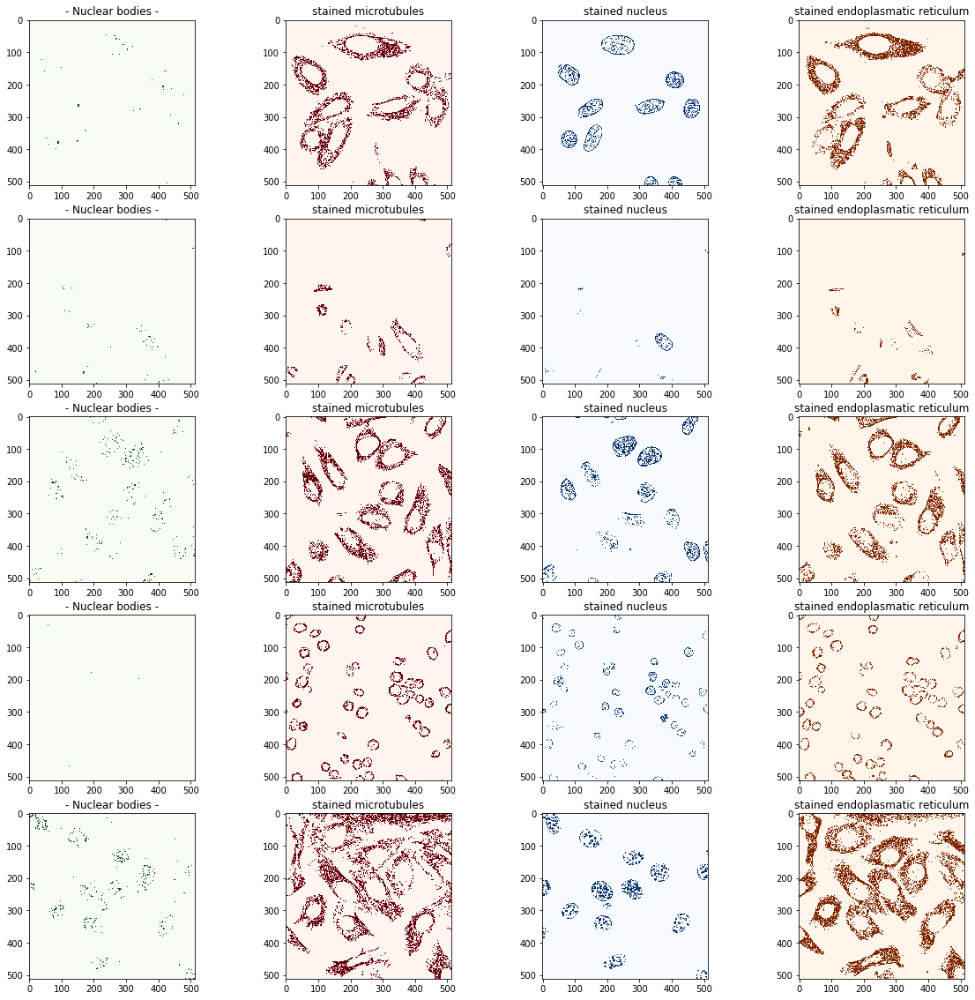

In [57]:
fig, ax = plt.subplots(5,4,figsize=(20,20))
filters=10
for n in range (5):
    make_image_row(images[n], ax[n], make_title(file_ids[n],train_labels), filters)

# Play different combinaison of filters in RBG: nuclear bodies

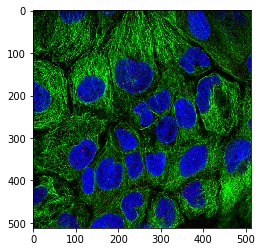

In [58]:
plt.imshow(images[7][:,:,:3].astype(np.uint8))

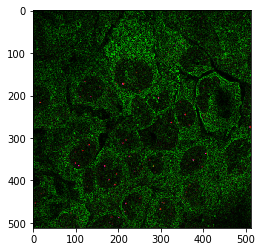

In [59]:
plt.imshow(images[7][:,:,[4,7,12]].astype(np.uint8))

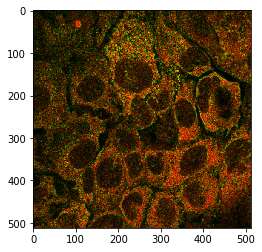

In [60]:
plt.imshow(images[7][:,:,[3,7,12]].astype(np.uint8))

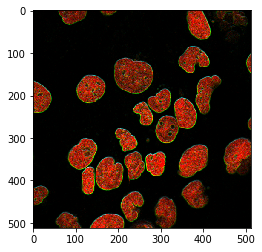

In [61]:
plt.imshow(images[7][:,:,[2,6,10]].astype(np.uint8))

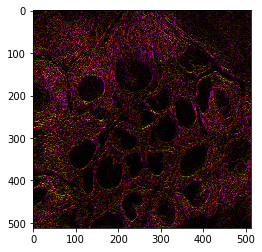

In [62]:
plt.imshow((images[7][:,:,[5,9,13]]).astype(np.uint8))

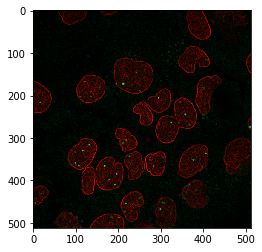

In [63]:
plt.imshow((images[7][:,:,[6,4,20]]).astype(np.uint8))

# Possible futur model

In [64]:
import keras
import sys
import numpy as np
import keras
from keras.utils import Sequence
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd
from tqdm import tqdm
import os
import imgaug as ia
from imgaug import augmenters as iaa
import cv2
import keras.backend as K
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
import os

from imgaug import augmenters as iaa
from imageio import imread
from sklearn.model_selection import RepeatedKFold
from multiprocessing import Pool
from skimage.filters import sobel_h,sobel_v
from skimage.measure import block_reduce

from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.preprocessing import text, sequence
from keras.losses import binary_crossentropy
from keras.utils import to_categorical
from keras.models import Model, Input, load_model
from keras.layers import BatchNormalization, add,Cropping2D, Dropout, Conv2D, MaxPooling2D, Dense, Flatten, Dropout, concatenate, UpSampling2D
from keras.metrics import categorical_accuracy
from keras.regularizers import l2
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import f1_score

Using TensorFlow backend.


# Model Training

## Model for Grad_threshold

In [65]:
'''def features_aumentation(image):    

    rot=np.arange(0, 360, 45)    
    eps=np.arange(0,128,20)
    
    grad_=False
    dir_grad_=False
    grad_threshold_=True 
    
    a=image
    
    if grad_:
        a=np.append(a,grad(image), axis=2)

    if dir_grad_:
        for i in rot:
            a=np.append(a,dirrectional_grad(image,i), axis=2)
    
    if grad_threshold_:
        for e in eps:      
            a=np.append(a, grad_threshold(image,e), axis=2)
        
    return a'''

'def features_aumentation(image):    \n\n    rot=np.arange(0, 360, 45)    \n    eps=np.arange(0,128,20)\n    \n    grad_=False\n    dir_grad_=False\n    grad_threshold_=True \n    \n    a=image\n    \n    if grad_:\n        a=np.append(a,grad(image), axis=2)\n\n    if dir_grad_:\n        for i in rot:\n            a=np.append(a,dirrectional_grad(image,i), axis=2)\n    \n    if grad_threshold_:\n        for e in eps:      \n            a=np.append(a, grad_threshold(image,e), axis=2)\n        \n    return a'

In [66]:
'''train_labels = pd.read_csv("/Users/mohamed/Desktop/train.csv")
train_labels = train_labels.apply(fill_targets, axis=1)
your_choice = list(label_names.values())
your_batch_size = 5'''

'train_labels = pd.read_csv("/Users/mohamed/Desktop/train.csv")\ntrain_labels = train_labels.apply(fill_targets, axis=1)\nyour_choice = list(label_names.values())\nyour_batch_size = 5'

In [67]:
'''# spoon-net

concat_axis = 3
input = Input((512,512,4))

conv1 = Conv2D(32, (3, 3), padding="same", name="conv1_1", kernel_initializer='uniform',activation="relu", data_format="channels_last")(input)
conv1 = Conv2D(32, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv1)
pool1 = MaxPooling2D(pool_size=(2, 2), data_format="channels_last")(conv1)
pool1= BatchNormalization()(pool1)

conv2 = Conv2D(64, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(pool1)
conv2 = Conv2D(64, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv2)
pool2 = MaxPooling2D(pool_size=(2, 2), data_format="channels_last")(conv2)
pool2= BatchNormalization()(pool2)

conv3 = Conv2D(128, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(pool2)
conv3 = Conv2D(128, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv3)
pool3 = MaxPooling2D(pool_size=(2, 2), data_format="channels_last")(conv3)
pool3= BatchNormalization()(pool3)

conv4 = Conv2D(256, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(pool3)
conv4 = Conv2D(256, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv4)
pool4 = MaxPooling2D(pool_size=(2, 2), data_format="channels_last")(conv4)
pool4= BatchNormalization()(pool4)

conv5 = Conv2D(512, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(pool4)
conv5 = Conv2D(512, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv5)

up_conv5 = UpSampling2D(size=(2, 2),data_format="channels_last")(conv5)
ch, cw = get_crop_shape(conv4, up_conv5)
crop_conv4 = Cropping2D(cropping=(ch,cw), data_format="channels_last")(conv4)
up6   = concatenate([up_conv5, crop_conv4], axis=concat_axis)
conv6 = Conv2D(256, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(up6)
conv6 = Conv2D(256, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv6)

up_conv6 = UpSampling2D(size=(2, 2),data_format="channels_last")(conv6)
ch, cw = get_crop_shape(conv3, up_conv6)
crop_conv3 = Cropping2D(cropping=(ch,cw), data_format="channels_last")(conv3)
up7   = concatenate([up_conv6, crop_conv3], axis=concat_axis)
conv7 = Conv2D(128, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(up7)
conv7 = Conv2D(128, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv7)

up_conv7 = UpSampling2D(size=(2, 2), data_format="channels_last")(conv7)
ch, cw = get_crop_shape(conv2, up_conv7)
crop_conv2 = Cropping2D(cropping=(ch,cw), data_format="channels_last")(conv2)
up8   = concatenate([up_conv7, crop_conv2], axis=concat_axis)
conv8 = Conv2D(64, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(up8)
conv8 = Conv2D(64, (3, 3), padding="same", activation="relu", kernel_initializer='uniform',data_format="channels_last")(conv8)

up_conv8 = UpSampling2D(size=(2, 2), data_format="channels_last")(conv8)
ch, cw = get_crop_shape(conv1, up_conv8)
crop_conv1 = Cropping2D(cropping=(ch,cw), data_format="channels_last")(conv1)
up9   = concatenate([up_conv8, crop_conv1], axis=concat_axis)
conv9 = Conv2D(32, (3, 3), padding="same", activation="relu", kernel_initializer='uniform', data_format="channels_last")(up9)
conv9 = Conv2D(32, (3, 3), padding="same", activation="relu", kernel_initializer='uniform', data_format="channels_last")(conv9)

x= conv9

A = Conv2D(32, kernel_size=3, strides=2, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(x)
A = MaxPooling2D(pool_size=2, strides=1, padding="valid")(A)
A= BatchNormalization()(A)

B = Conv2D(32, kernel_size=3, strides=2, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(A)
B = MaxPooling2D(pool_size=2, strides=1, padding="valid")(B)
B= BatchNormalization()(B)

C = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(B)
C = MaxPooling2D(pool_size=2, strides=1, padding="valid")(C)
C= BatchNormalization()(C)

D = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(C)
D = MaxPooling2D(pool_size=2, strides=1, padding="valid")(D)
D = BatchNormalization()(D)

E = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(D)
E = MaxPooling2D(pool_size=2, strides=1, padding="valid")(E)
E = BatchNormalization()(E)

F = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(E)
F = MaxPooling2D(pool_size=2, strides=1, padding="valid")(F)
F = BatchNormalization()(F)

G = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(F)
G = MaxPooling2D(pool_size=2, strides=1, padding="valid")(G)
G = BatchNormalization()(G)

H = Conv2D(32, kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='uniform',kernel_regularizer=l2(0.001))(G)
H = MaxPooling2D(pool_size=2, strides=1, padding="valid")(H)
H = BatchNormalization()(H)

H= Flatten()(H)
H= Dropout(0.3)(H)

x = Dense((128),activation='relu', kernel_regularizer=l2(0.001), kernel_initializer='uniform')(H)

x=Dropout (0.3)(x)
x=Dense((256),activation='relu', kernel_regularizer=l2(0.001), kernel_initializer='uniform')(x)

output = Dense(28, activation = "sigmoid", kernel_initializer='uniform')(x)

model = Model(inputs=[input], outputs=[output])

model.summary()'''

'# spoon-net\n\nconcat_axis = 3\ninput = Input((512,512,4))\n\nconv1 = Conv2D(32, (3, 3), padding="same", name="conv1_1", kernel_initializer=\'uniform\',activation="relu", data_format="channels_last")(input)\nconv1 = Conv2D(32, (3, 3), padding="same", activation="relu", kernel_initializer=\'uniform\',data_format="channels_last")(conv1)\npool1 = MaxPooling2D(pool_size=(2, 2), data_format="channels_last")(conv1)\npool1= BatchNormalization()(pool1)\n\nconv2 = Conv2D(64, (3, 3), padding="same", activation="relu", kernel_initializer=\'uniform\',data_format="channels_last")(pool1)\nconv2 = Conv2D(64, (3, 3), padding="same", activation="relu", kernel_initializer=\'uniform\',data_format="channels_last")(conv2)\npool2 = MaxPooling2D(pool_size=(2, 2), data_format="channels_last")(conv2)\npool2= BatchNormalization()(pool2)\n\nconv3 = Conv2D(128, (3, 3), padding="same", activation="relu", kernel_initializer=\'uniform\',data_format="channels_last")(pool2)\nconv3 = Conv2D(128, (3, 3), padding="same"

In [68]:
'''model.compile(optimizer = "nadam", loss = "binary_crossentropy", metrics=['accuracy'])
nb_epochs = 5'''

'model.compile(optimizer = "nadam", loss = "binary_crossentropy", metrics=[\'accuracy\'])\nnb_epochs = 5'

In [69]:
'''for e in range (nb_epochs):
    imageloader = TargetGroupIterator(your_choice, your_batch_size, train_path)
    imageloader.find_matching_data_entries()
    iterator = imageloader.get_loader()
    file_ids, labels, images = next(iterator)
    for i in range (500):
        print("Epoch : {}, Batch : {}".format(e,i))
        file_ids, labels, images = next(iterator)
        model_1.fit(images, labels)'''

'for e in range (nb_epochs):\n    imageloader = TargetGroupIterator(your_choice, your_batch_size, train_path)\n    imageloader.find_matching_data_entries()\n    iterator = imageloader.get_loader()\n    file_ids, labels, images = next(iterator)\n    for i in range (500):\n        print("Epoch : {}, Batch : {}".format(e,i))\n        file_ids, labels, images = next(iterator)\n        model_1.fit(images, labels)'

# Possible Other augmentation

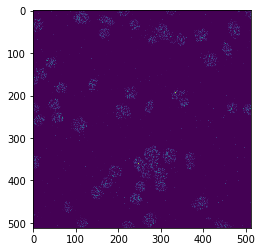

In [70]:
def data_aug(image, angle, zoom):
    (h, w) = (512,512)
    center = (h//2, w//2)
    M = cv2.getRotationMatrix2D(center, angle, zoom)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

plt.imshow(data_aug(images[3], 270, 1).astype(np.uint8)[:,:,0])

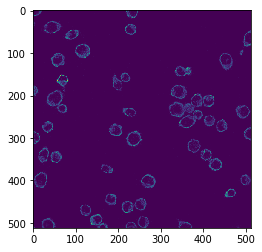

In [71]:
plt.imshow(images[3].astype(np.uint8)[:,:,3])

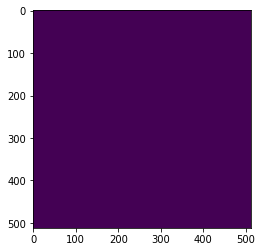

In [72]:
def data_aug_rand(image, angle, zoom):
    (h, w) = (512,512)
    center = (np.random.randint(512), np.random.randint(512))
    M = cv2.getRotationMatrix2D(center, angle, zoom)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

plt.imshow(data_aug_rand(images[0], 90, 3).astype(np.uint8)[:,:,0])

In [73]:
def data_aug(image):
    #!!!!!!!!!!!!!!!!!!!! next time use symmetry !!!!!!!!!!!!!!!!!!
    
    angle = [ 90, 180, 270 ] 
    zoom = 1
    (h, w) = image.shape[1:3]
    center = (w // 2, h // 2)
    image_bis = image[0]
    image_f = image
    for a in angle:
        M = cv2.getRotationMatrix2D(center, a, zoom)
        rotated0 = cv2.warpAffine(image_bis[:,:,0], M, (w, h))
        rotated1 = cv2.warpAffine(image_bis[:,:,1], M, (w, h))
        rotated2 = cv2.warpAffine(image_bis[:,:,2], M, (w, h))
        rotated3 = cv2.warpAffine(image_bis[:,:,3], M, (w, h))
        rotated = np.array([np.array([rotated0.T, rotated1.T, rotated2.T, rotated3.T]).T])
        image_f = np.append(image_f, rotated, axis=0) 
    
    return image_f

#plt.imshow(data_aug(images[0], 90, 1).astype(np.uint8)[:,:,0])

In [74]:
def image_block(images,block_size,orientations):
    theta=np.linspace(0,np.pi,orientations,endpoint=False)
    v_x=np.cos(theta)
    v_y=np.sin(theta)
    edge_x=np.empty_like(images)
    edge_y=np.empty_like(images)
    for idx,image in enumerate(images):

        edge_x[idx]=sobel_h(image)
        edge_y[idx]=sobel_v(image)

    #print("edge_x",edge_x.shape,"edge_y",edge_y.shape)
    edges= edge_x[:,:,:,np.newaxis]*v_x+edge_y[:,:,:,np.newaxis]*v_y
    #print("edges",edges.shape)
    features=np.maximum(edges,0)
    block=(1,block_size,block_size,1)
    block_features=block_reduce(features,block,np.mean)
    #print("block_features",block_features.shape)
    return np.array(block_features)

In [75]:
def make_image_row_block(image, subax, title, block_size, orientations,r):
    subax[0].imshow(image_block(image,block_size,orientations)[:,:,:,r][0], cmap="Greens")
    subax[1].imshow(image_block(image,block_size,orientations)[:,:,:,r][1], cmap="Reds")
    subax[1].set_title("stained microtubules block_size={}, r={}".format(block_size,r))
    subax[2].imshow(image_block(image,block_size,orientations)[:,:,:,r][2], cmap="Blues")
    subax[2].set_title("stained nucleus block_size={}, r={}".format(block_size,r))
    subax[3].imshow(image_block(image,block_size,orientations)[:,:,:,r][3], cmap="Oranges")
    subax[3].set_title("stained endoplasmatic block_size={}, r={}".format(block_size,r))
    subax[0].set_title(title)
    return subax

In [76]:
block=[5,10,15,30,50]
rotations=4

In [77]:
train_labels = pd.read_csv("/Users/mohamed/Desktop/train.csv")
train_labels = train_labels.apply(fill_targets, axis=1)
your_choice = list(label_names.values())
your_batch_size = 1

In [78]:
imageloader = TargetGroupIterator(your_choice, your_batch_size,
                                  labels_path, train_path, ws = 3, 
                                  grad = True, dir_grad = True, grad_threshold = True,
                                 nb_rot= 4, nb_threshold=12, reduce=False, block_size=0)
imageloader.find_matching_data_entries()
iterator = imageloader.get_loader()
file_ids, labels, images = next(iterator)

In [79]:
imag = images[:,:,:,:4]
img=imag[0].T
images2 = np.array([img])

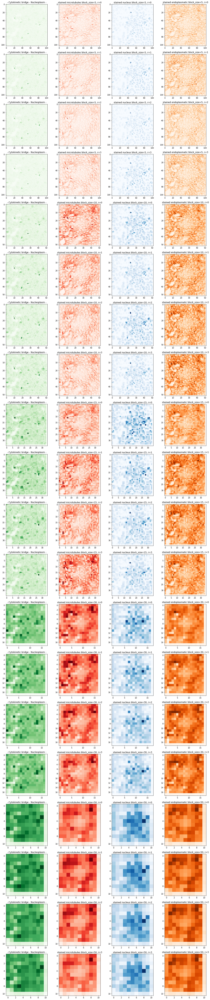

In [80]:
fig, ax = plt.subplots(len(block)*rotations,4,figsize=(20,5*len(block)*rotations))
Idx=0
for n in range(1):
    for b in block:
        for r in range (rotations):
            make_image_row_block(images2[n], ax[n+Idx], make_title(file_ids[n], train_labels), b, rotations, r)
            Idx+=1
#plt.savefig("blocks.png")

https://medium.com/@thongonary/how-to-compute-f1-score-for-each-epoch-in-keras-a1acd17715a2

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html